<a href="https://colab.research.google.com/github/audreyemmely/computer-vision/blob/main/visaocomp_lista2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Resolução Lista 2**
---

ARQUIMEDES VINÍCIUS PEREIRA DE FRANÇA MOURA

AUDREY EMMELY RODRIGUES VASCONCELOS



## Instalação do opencv

In [ ]:
!pip install opencv-python==4.4.0.44
!pip install opencv-contrib-python==4.4.0.44

## Importando bibliotecas

In [ ]:
import cv2
import copy as cp
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import skimage
import skimage.filters
from google.colab.patches import cv2_imshow

## Importando assets

In [ ]:
path1 = 'https://user-images.githubusercontent.com/52829664/164506184-39f1a1c0-0cc1-47f6-b88a-9cbf4770a84a.jpg'
path2 = 'https://user-images.githubusercontent.com/52829664/164530606-937ce3ae-e0d0-4325-a691-1d6122ad58c7.jpg'
path3 = 'https://user-images.githubusercontent.com/52829664/164528632-e9982a17-fa45-4c89-9243-c07dcd74918b.jpg'
path4 = 'https://user-images.githubusercontent.com/52829664/163676627-e9d549ee-a15c-4703-a8ed-b5c780d5975c.jpeg'
path5 = 'https://user-images.githubusercontent.com/52829664/164074882-74c0daa2-140c-44f5-90bd-99c668e3a8d3.jpeg'
path6 = 'https://user-images.githubusercontent.com/52829664/164532075-d2645b60-d62f-4f94-a95a-6e8d30ae38c4.jpg'

In [ ]:
img1 = io.imread(path1)
img2 = io.imread(path2)
img3 = io.imread(path3)
img4 = io.imread(path4)
img5 = io.imread(path5)
img6 = io.imread(path6)

## Questão 1

Na documentação da OpenCV é possível encontrar diversos detectores e descritores. Usando um conjunto com pelo menos 6 imagens (você
pode tirar fotos com seu telefone, por exemplo), experimente três detectores distintos nestas imagens, incluindo o detector de Harris. Pesquise e descreva resumidamente com suas palavras (até 200 palavras para cada) como cada um funciona, incluindo seus parâmetros e quais suas principais diferenças.
Exiba resultados nas suas imagens, e em quais situações cada um funciona bem ou mal. Discuta seus parâmetros. Qual deles você achou melhor? Justifique.

**Detector de Harris**

O funcionamento do algoritmo pode ser resumido da seguinte forma:

PASSO 1. Determina quais janelas (pequenas manchas de imagem) produzem variações muito grandes de intensidade quando movidas nas direções X e Y (ou seja, gradientes).

PASSO 2. Com cada janela encontrada, uma pontuação R é computada.

PASSO 3. Após aplicar um limite a esta pontuação, cantos importantes são selecionados e marcados.

A seguir estão os argumentos da função `cv2.cornerHarris()`:

* img - Imagem de entrada. Deve ser em tons de cinza e tipo float32.
* blockSize - É o tamanho da vizinhança considerada para detecção de canto
* ksize - Parâmetro de abertura da derivada de Sobel utilizada.
* k - Parâmetro livre do detector de Harris na equação.

In [ ]:
ori = img1.copy()
im_harris = img1.copy()
im_shi = img1.copy()
im_fast = img1.copy()
im_log = img1.copy()

ori2 = img2.copy()
im_harris2 = img2.copy()
im_shi2 = img2.copy()
im_fast2 = img2.copy()

ori3 = img3.copy()
im_harris3 = img3.copy()
im_shi3 = img3.copy()
im_fast3 = img3.copy()

ori4 = img4.copy()
im_harris4 = img4.copy()
im_shi4 = img4.copy()
im_fast4 = img4.copy()

ori5 = img5.copy()
im_harris5 = img5.copy()
im_shi5 = img5.copy()
im_fast5 = img5.copy()

ori6 = img6.copy()
im_harris6 = img6.copy()
im_shi6 = img6.copy()
im_fast6 = img6.copy()

In [ ]:
def harrisDetector(image):
    gray_img = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    gray_img = np.float32(gray_img)

    corners_img = cv2.cornerHarris(gray_img,2,3,0.04)
    corners_img = cv2.dilate(corners_img,None)
 
    image[corners_img>0.01*corners_img.max()] = [255,0,0]

    return image

In [ ]:
image_harris = harrisDetector(im_harris)
image_harris2 = harrisDetector(im_harris2)
image_harris3 = harrisDetector(im_harris3)
image_harris4 = harrisDetector(im_harris4)
image_harris5 = harrisDetector(im_harris5)
image_harris6 = harrisDetector(im_harris6)

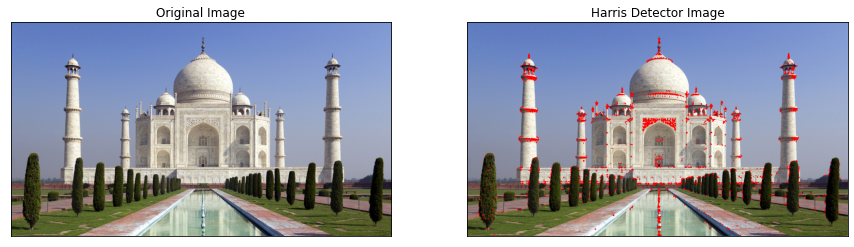

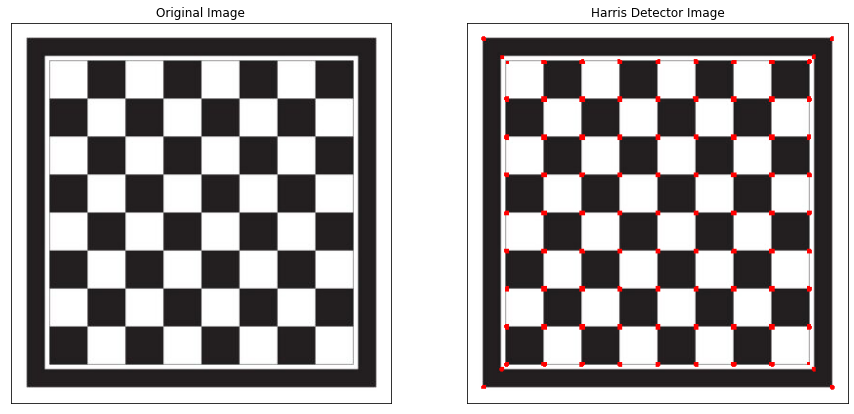

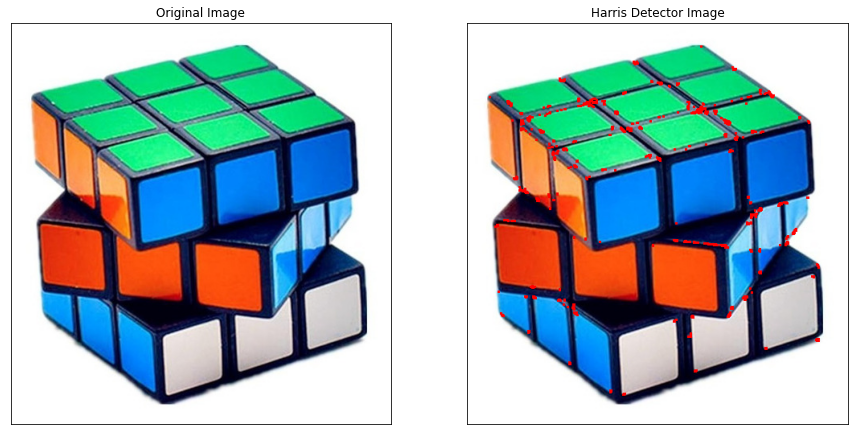

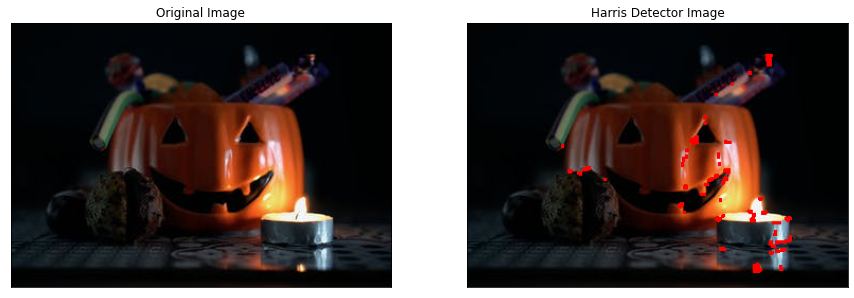

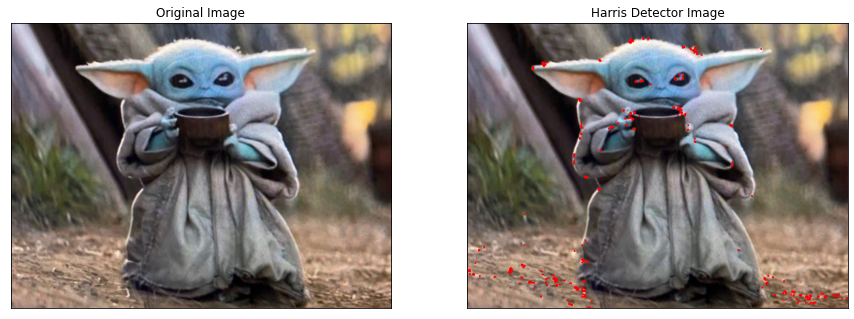

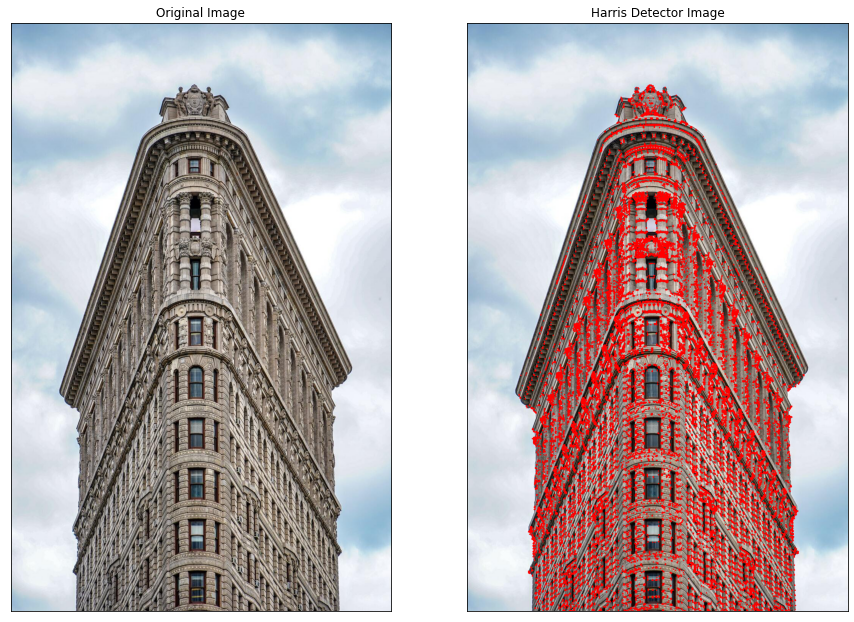

In [ ]:
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori)
axarr[1].imshow(image_harris)
plt.sca(axarr[0]); plt.imshow(ori); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_harris); plt.title('Harris Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori2)
axarr[1].imshow(image_harris2)
plt.sca(axarr[0]); plt.imshow(ori2); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_harris2); plt.title('Harris Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori3)
axarr[1].imshow(image_harris3)
plt.sca(axarr[0]); plt.imshow(ori3); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_harris3); plt.title('Harris Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori4)
axarr[1].imshow(image_harris4)
plt.sca(axarr[0]); plt.imshow(ori4); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_harris4); plt.title('Harris Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori5)
axarr[1].imshow(image_harris5)
plt.sca(axarr[0]); plt.imshow(ori5); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_harris5); plt.title('Harris Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori6)
axarr[1].imshow(image_harris6)
plt.sca(axarr[0]); plt.imshow(ori6); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_harris6); plt.title('Harris Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()

**Detector de Shi-Tomasi**

Shi-Tomasi é semelhante ao detector de Harris, exceto pela forma como a pontuação (R) é calculada. Em Shi-Tomasi temos um resultado melhor. Além disso, neste método, podemos encontrar os *n* cantos superiores, o que pode ser útil caso não queiramos detectar todos os cantos.

A seguir estão os argumentos da função `cv2.goodFeaturesToTrack()`:

* image - A imagem em tons de cinza de entrada
* maxCorners - O número máximo de cantos a serem detectados
* qualityLevel - A qualidade ou limite mínimo esperado a ser considerado como um canto.
* minDistance - A distância euclidiana mínima possível entre dois cantos

In [ ]:
def shi_tomasi(image):
    gray_img = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    corners_img = cv2.goodFeaturesToTrack(gray_img,1000,0.02,10)
    corners_img = np.int0(corners_img)

    for corners in corners_img:
        x,y = corners.ravel()
        cv2.circle(image,(x,y),3,[255,0,0],-1)

    return image

In [ ]:
image_shi = shi_tomasi(im_shi)
image_shi2 = shi_tomasi(im_shi2)
image_shi3 = shi_tomasi(im_shi3)
image_shi4 = shi_tomasi(im_shi4)
image_shi5 = shi_tomasi(im_shi5)
image_shi6 = shi_tomasi(im_shi6)

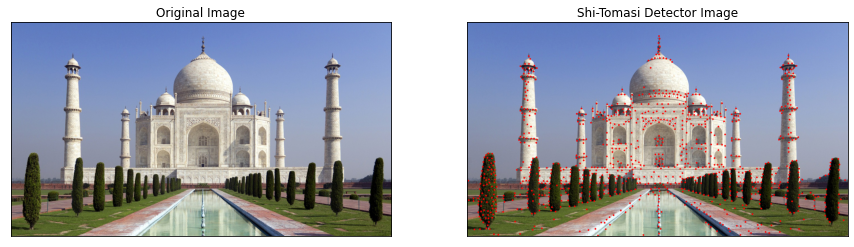

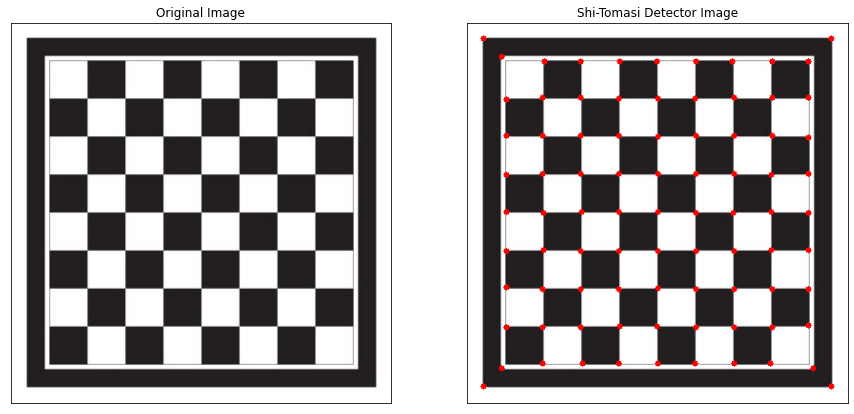

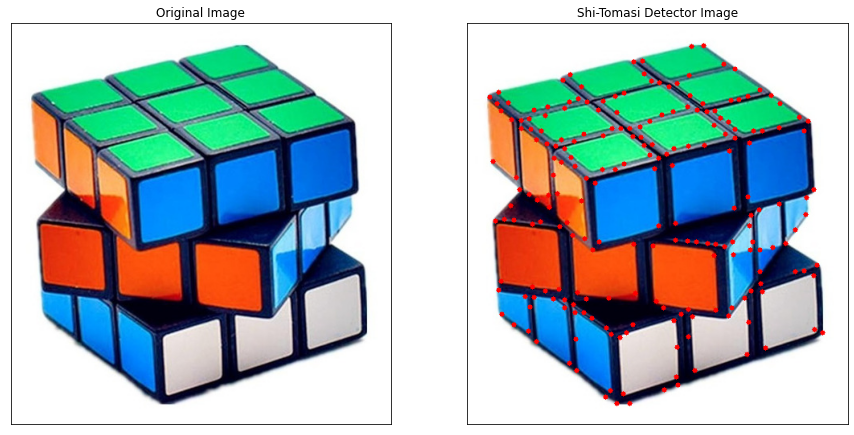

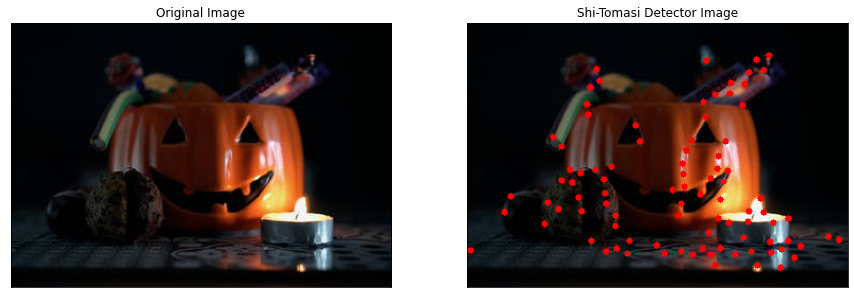

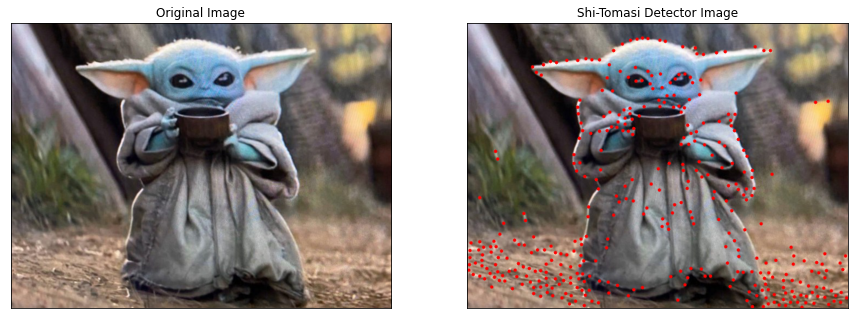

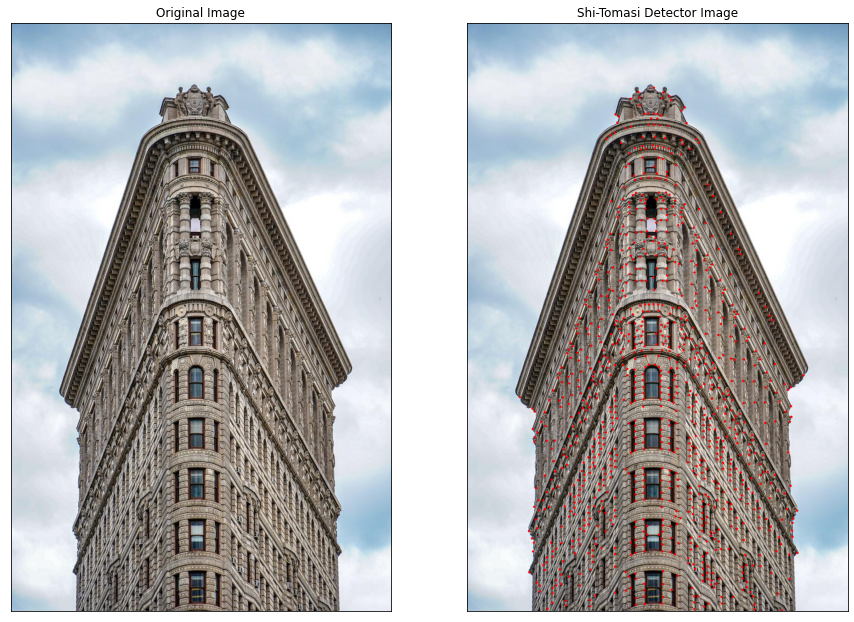

In [ ]:
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori)
axarr[1].imshow(image_shi)
plt.sca(axarr[0]); plt.imshow(ori); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_shi); plt.title('Shi-Tomasi Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori2)
axarr[1].imshow(image_shi2)
plt.sca(axarr[0]); plt.imshow(ori2); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_shi2); plt.title('Shi-Tomasi Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori3)
axarr[1].imshow(image_shi3)
plt.sca(axarr[0]); plt.imshow(ori3); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_shi3); plt.title('Shi-Tomasi Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori4)
axarr[1].imshow(image_shi4)
plt.sca(axarr[0]); plt.imshow(ori4); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_shi4); plt.title('Shi-Tomasi Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori5)
axarr[1].imshow(image_shi5)
plt.sca(axarr[0]); plt.imshow(ori5); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_shi5); plt.title('Shi-Tomasi Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori6)
axarr[1].imshow(image_shi6)
plt.sca(axarr[0]); plt.imshow(ori6); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_shi6); plt.title('Shi-Tomasi Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()

**Detector FAST**

FAST é um algoritmo para detectar pontos de interesse proposto por Rosten e Drummond. O algoritmo FAST fornece resultados altos na detecção de cantos. O padrão de teste de segmento é executado na imagem tomando um círculo de 16 pixels chamado círculo de Bresenham ao redor do pixel.

In [ ]:
def fastFunc(image):
  gray_img = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  fast = cv2.FastFeatureDetector_create()
  kp = fast.detect(gray_img,None)
  img = cv2.drawKeypoints(image, kp, None, color=(255,0,0))
  return img

In [ ]:
image_fast = fastFunc(im_fast)
image_fast2 = fastFunc(im_fast2)
image_fast3 = fastFunc(im_fast3)
image_fast4 = fastFunc(im_fast4)
image_fast5 = fastFunc(im_fast5)
image_fast6 = fastFunc(im_fast6)

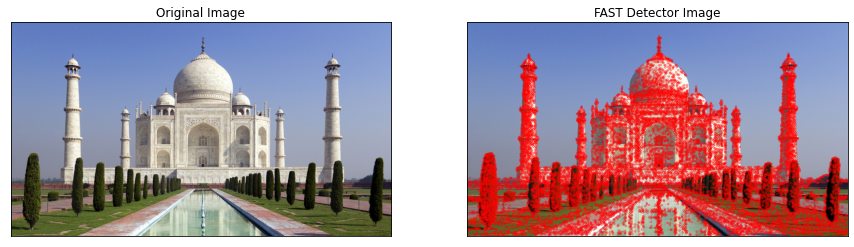

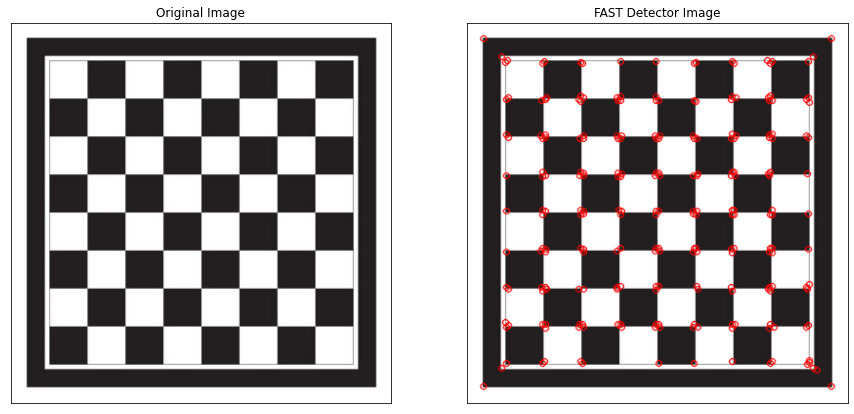

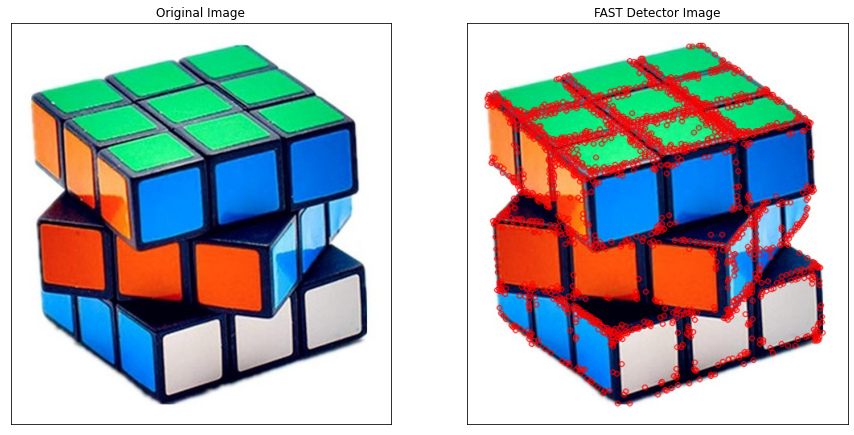

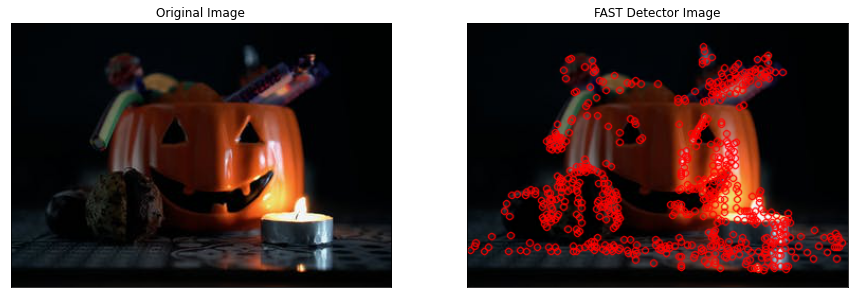

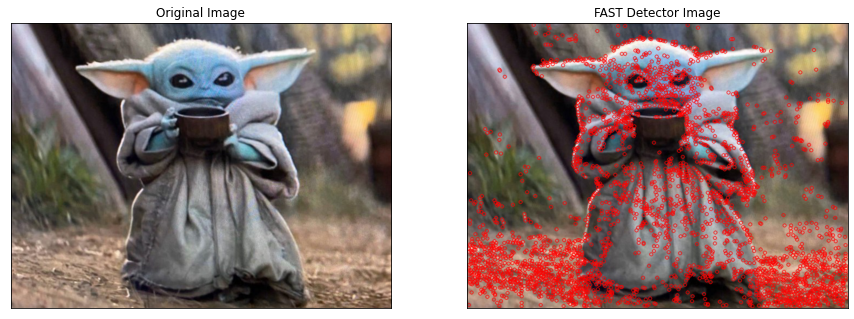

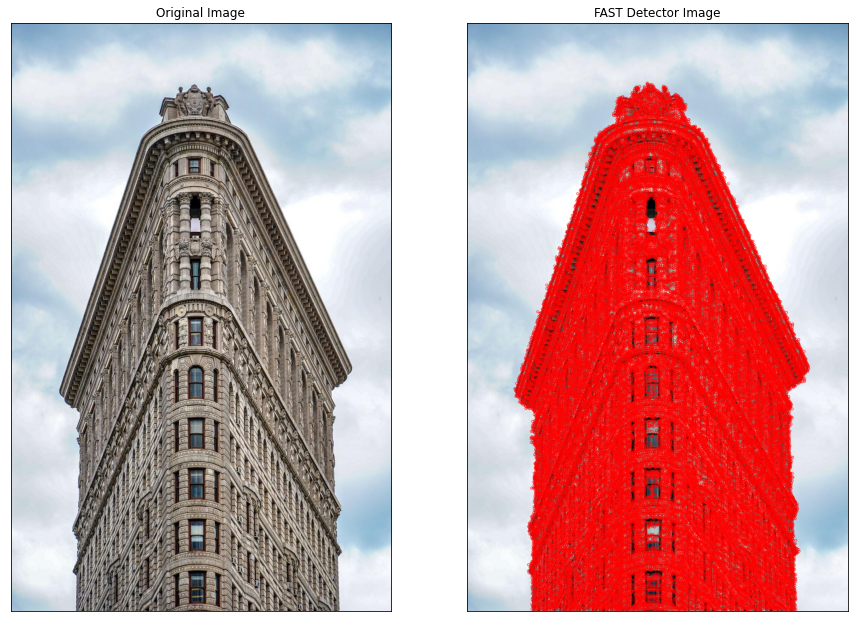

In [ ]:
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori)
axarr[1].imshow(image_fast)
plt.sca(axarr[0]); plt.imshow(ori); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_fast); plt.title('FAST Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori2)
axarr[1].imshow(image_fast2)
plt.sca(axarr[0]); plt.imshow(ori2); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_fast2); plt.title('FAST Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori3)
axarr[1].imshow(image_fast3)
plt.sca(axarr[0]); plt.imshow(ori3); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_fast3); plt.title('FAST Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori4)
axarr[1].imshow(image_fast4)
plt.sca(axarr[0]); plt.imshow(ori4); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_fast4); plt.title('FAST Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori5)
axarr[1].imshow(image_fast5)
plt.sca(axarr[0]); plt.imshow(ori5); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_fast5); plt.title('FAST Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()
figure, axarr = plt.subplots(nrows=1,ncols=2,figsize=(15, 15))
axarr[0].imshow(ori6)
axarr[1].imshow(image_fast6)
plt.sca(axarr[0]); plt.imshow(ori6); plt.title('Original Image'); plt.xticks([]); plt.yticks([])
plt.sca(axarr[1]); plt.imshow(image_fast6); plt.title('FAST Detector Image'); plt.xticks([]); plt.yticks([])
plt.show()

Podemos concluir que o detector FAST tem melhor desempenho do que Shi-Tomasi e Harris na detecção de pontos de cantos precisos e reais. A detecção de canto Shi-Tomasi é mais forte ao ruído do que FAST e Harris.

## Questão 2

Repita o mesmo procedimento acima para 3 tipos de descritores,
incluindo o SIFT.

In [ ]:
def siftComputeFunction(img):
  copy = img.copy()
  gray = cv2.cvtColor(copy,cv2.COLOR_BGR2GRAY)
  sift = cv2.xfeatures2d.SIFT_create()
  kp,des = sift.detectAndCompute(gray,None)
  result = cv2.drawKeypoints(copy,kp,copy,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return result

def briefFunction(img):
  copy = img.copy()
  gray = cv2.cvtColor(copy,cv2.COLOR_BGR2GRAY)
  star = cv2.xfeatures2d.StarDetector_create()
  brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
  kp = star.detect(gray,None)
  kp, des = brief.compute(copy, kp)
  result = cv2.drawKeypoints(copy,kp,copy,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return result
  
def orbFunction(img):
  copy = img.copy()
  gray = cv2.cvtColor(copy,cv2.COLOR_BGR2GRAY)
  orb = cv2.ORB_create()
  kp = orb.detect(gray,None)
  kp, des = orb.compute(copy, kp)
  result = cv2.drawKeypoints(copy,kp,copy,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  return result

(-0.5, 3999.5, 1545.5, -0.5)

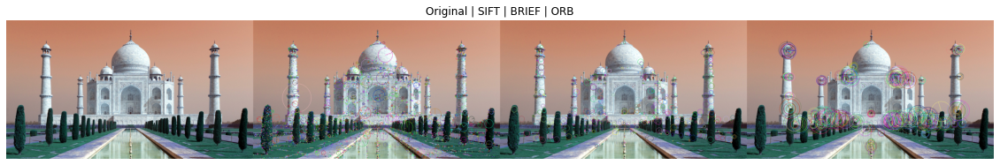

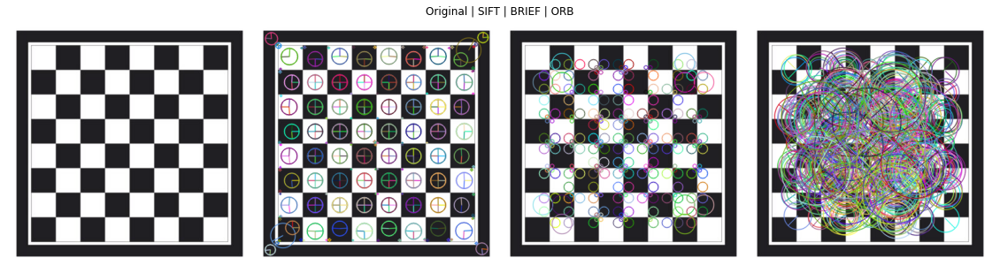

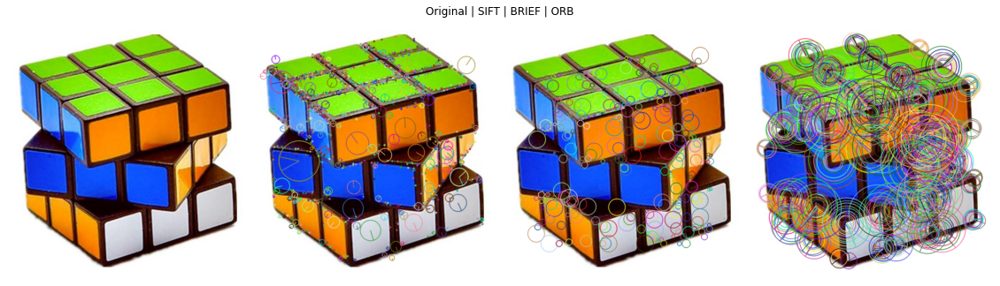

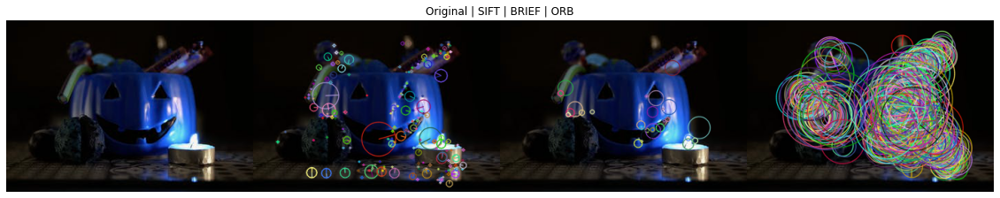

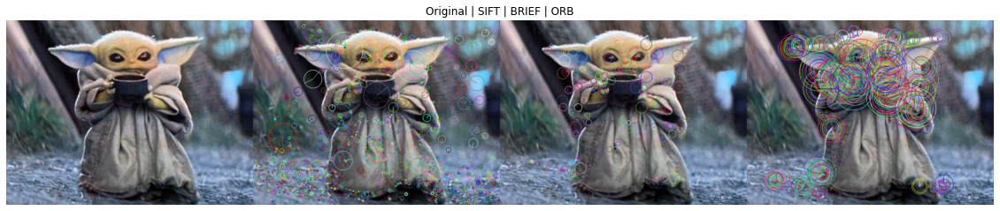

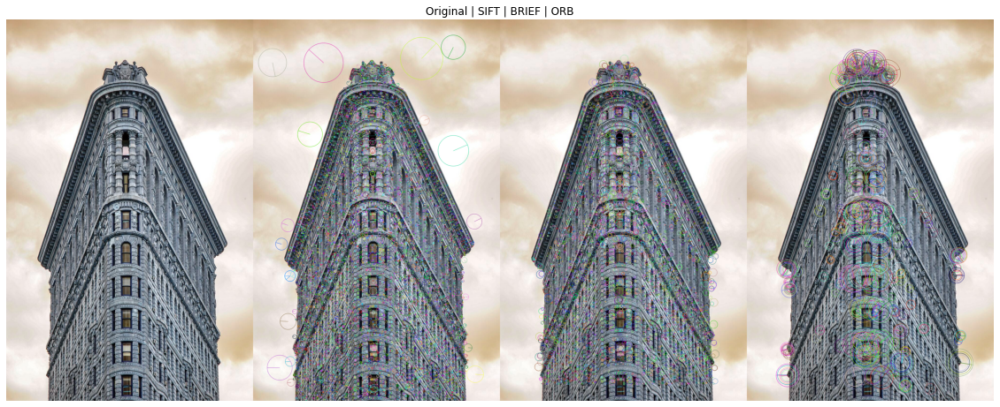

In [ ]:
image1_brief = briefFunction(img1)
image1_siftDetect = siftComputeFunction(img1)
image1_orb = orbFunction(img1)

fig = plt.figure(figsize=(20,20))
output = cv2.hconcat([cv2.cvtColor(img1,cv2.COLOR_BGR2RGB), cv2.cvtColor(image1_siftDetect,cv2.COLOR_BGR2RGB), cv2.cvtColor(image1_brief,cv2.COLOR_BGR2RGB), cv2.cvtColor(image1_orb,cv2.COLOR_BGR2RGB)])
ax = fig.add_subplot(111)
ax.imshow(output)
ax.set_title('Original | SIFT | BRIEF | ORB')
plt.axis('off')

image2_brief = briefFunction(img2)
image2_siftDetect = siftComputeFunction(img2)
image2_orb = orbFunction(img2)

fig = plt.figure(figsize=(20,20))
output = cv2.hconcat([cv2.cvtColor(img2,cv2.COLOR_BGR2RGB), cv2.cvtColor(image2_siftDetect,cv2.COLOR_BGR2RGB), cv2.cvtColor(image2_brief,cv2.COLOR_BGR2RGB), cv2.cvtColor(image2_orb,cv2.COLOR_BGR2RGB)])
ax = fig.add_subplot(111)
ax.imshow(output)
ax.set_title('Original | SIFT | BRIEF | ORB')
plt.axis('off')

image3_brief = briefFunction(img3)
image3_siftDetect = siftComputeFunction(img3)
image3_orb = orbFunction(img3)

fig = plt.figure(figsize=(20,20))
output = cv2.hconcat([cv2.cvtColor(img3,cv2.COLOR_BGR2RGB), cv2.cvtColor(image3_siftDetect,cv2.COLOR_BGR2RGB), cv2.cvtColor(image3_brief,cv2.COLOR_BGR2RGB), cv2.cvtColor(image3_orb,cv2.COLOR_BGR2RGB)])
ax = fig.add_subplot(111)
ax.imshow(output)
ax.set_title('Original | SIFT | BRIEF | ORB')
plt.axis('off')

image4_brief = briefFunction(img4)
image4_siftDetect = siftComputeFunction(img4)
image4_orb = orbFunction(img4)

fig = plt.figure(figsize=(20,20))
output = cv2.hconcat([cv2.cvtColor(img4,cv2.COLOR_BGR2RGB), cv2.cvtColor(image4_siftDetect,cv2.COLOR_BGR2RGB), cv2.cvtColor(image4_brief,cv2.COLOR_BGR2RGB), cv2.cvtColor(image4_orb,cv2.COLOR_BGR2RGB)])
ax = fig.add_subplot(111)
ax.imshow(output)
ax.set_title('Original | SIFT | BRIEF | ORB')
plt.axis('off')

image5_brief = briefFunction(img5)
image5_siftDetect = siftComputeFunction(img5)
image5_orb = orbFunction(img5)

fig = plt.figure(figsize=(20,20))
output = cv2.hconcat([cv2.cvtColor(img5,cv2.COLOR_BGR2RGB), cv2.cvtColor(image5_siftDetect,cv2.COLOR_BGR2RGB), cv2.cvtColor(image5_brief,cv2.COLOR_BGR2RGB), cv2.cvtColor(image5_orb,cv2.COLOR_BGR2RGB)])
ax = fig.add_subplot(111)
ax.imshow(output)
ax.set_title('Original | SIFT | BRIEF | ORB')
plt.axis('off')

image6_brief = briefFunction(img6)
image6_siftDetect = siftComputeFunction(img6)
image6_orb = orbFunction(img6)

fig = plt.figure(figsize=(20,20))
output = cv2.hconcat([cv2.cvtColor(img6,cv2.COLOR_BGR2RGB), cv2.cvtColor(image6_siftDetect,cv2.COLOR_BGR2RGB), cv2.cvtColor(image6_brief,cv2.COLOR_BGR2RGB), cv2.cvtColor(image6_orb,cv2.COLOR_BGR2RGB)])
ax = fig.add_subplot(111)
ax.imshow(output)
ax.set_title('Original | SIFT | BRIEF | ORB')
plt.axis('off')

## Questão 3

Repita o mesmo procedimento acima para 3 algoritmos de geração
de correspondências (*matching*).

In [ ]:
query_img = io.imread('https://user-images.githubusercontent.com/52829664/164566143-a2c721ac-2d32-4faa-a858-bac50c5bfc9f.jpg')
query_img2 = io.imread('https://user-images.githubusercontent.com/52829664/164565135-31f56c43-8d7f-41a3-8e21-a564512b3963.jpg')
query_img3 = io.imread('https://user-images.githubusercontent.com/52829664/164566009-527505bb-03ce-4f5b-aa45-b181e94a1cf2.jpg')
query_img4 = io.imread('https://user-images.githubusercontent.com/52829664/164567073-9c8db6e8-5bcd-4895-bd94-f89b0cb95366.jpeg')
query_img5 = io.imread('https://user-images.githubusercontent.com/52829664/164567339-dd8097cd-17b7-4a9a-b5b1-c0c7607df625.jpeg')
query_img6 = io.imread('https://user-images.githubusercontent.com/52829664/164788473-cecf982e-571b-41f4-bc95-2525c68aa559.jpg')

**Brute-Force (BF) Matcher with ORB**

In [ ]:
def orbAlg(query_img, train_img):
  query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
  train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)

  orb = cv2.ORB_create()

  queryKeypoints, queryDescriptors = orb.detectAndCompute(query_img_bw,None)
  trainKeypoints, trainDescriptors = orb.detectAndCompute(train_img_bw,None)
  
  matcher = cv2.BFMatcher()
  matches = matcher.match(queryDescriptors,trainDescriptors)
    
  final_img = cv2.drawMatches(query_img, queryKeypoints, train_img, trainKeypoints, matches[:15],None)
    
  final_img = cv2.resize(final_img, (650,350))
  
  return final_img

In [ ]:
img_bforb = orbAlg(query_img, img1)
img_bforb2 = orbAlg(query_img2, img2)
img_bforb3 = orbAlg(query_img3, img3)
img_bforb4 = orbAlg(query_img4, img4)
img_bforb5 = orbAlg(query_img5, img5)
img_bforb6 = orbAlg(query_img6, img6)

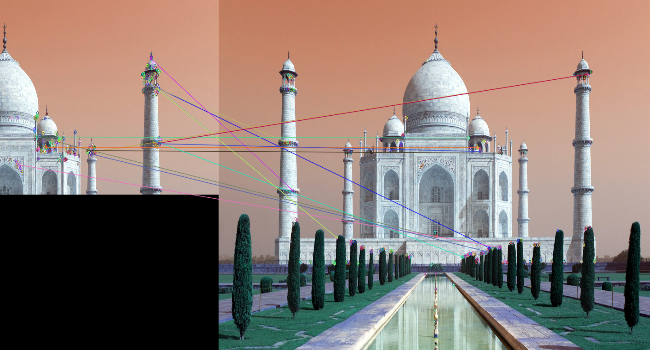

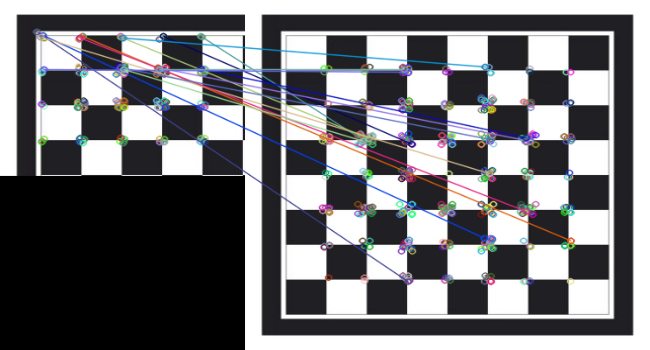

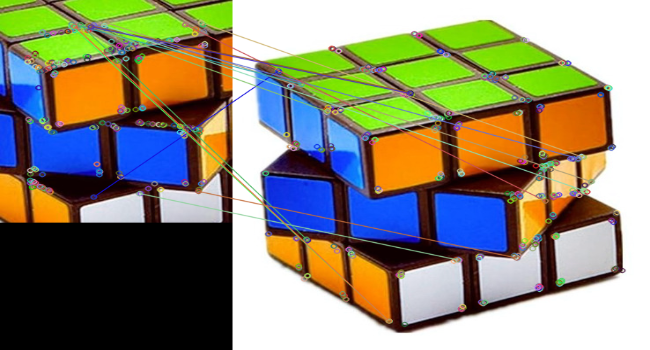

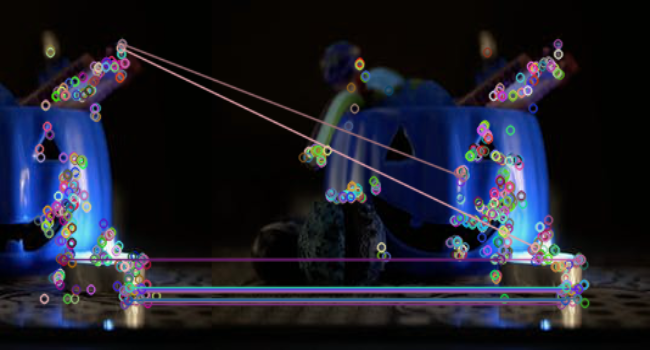

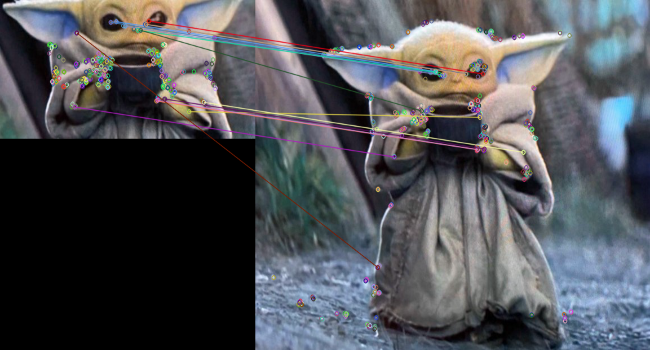

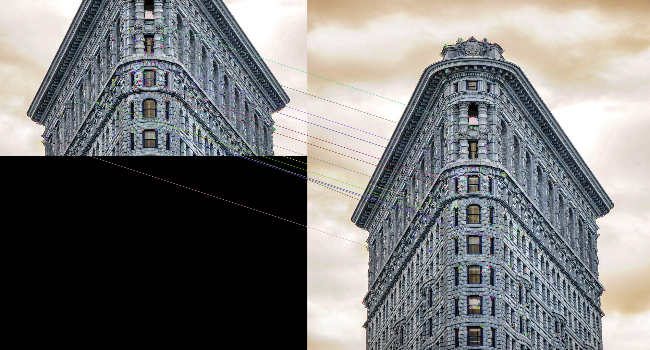

In [ ]:
cv2_imshow(img_bforb)
cv2_imshow(img_bforb2)
cv2_imshow(img_bforb3)
cv2_imshow(img_bforb4)
cv2_imshow(img_bforb5)
cv2_imshow(img_bforb6)

**Brute-Force (BF) Matcher with SIFT**

In [ ]:
def siftAlg(query_img, train_img):
  query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
  train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
  sift = cv2.xfeatures2d.SIFT_create()
  keypoints1, descriptors1 = sift.detectAndCompute(query_img_bw, None)
  keypoints2, descriptors2 = sift.detectAndCompute(train_img_bw, None)
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(descriptors1, descriptors2,k=2)

  good_matches = []

  for m1, m2 in matches:
    if m1.distance < 0.6*m2.distance:
      good_matches.append([m1])
  
  sift_matches =cv2.drawMatchesKnn(query_img, keypoints1, train_img, keypoints2, good_matches, None, flags=2)
  sift_matches = cv2.resize(sift_matches, (650,350))
  return sift_matches

In [ ]:
img_bfsift = siftAlg(query_img, img1)
img_bfsift2 = siftAlg(query_img2, img2)
img_bfsift3 = siftAlg(query_img3, img3)
img_bfsift4 = siftAlg(query_img4, img4)
img_bfsift5 = siftAlg(query_img5, img5)
img_bfsift6 = siftAlg(query_img6, img6)

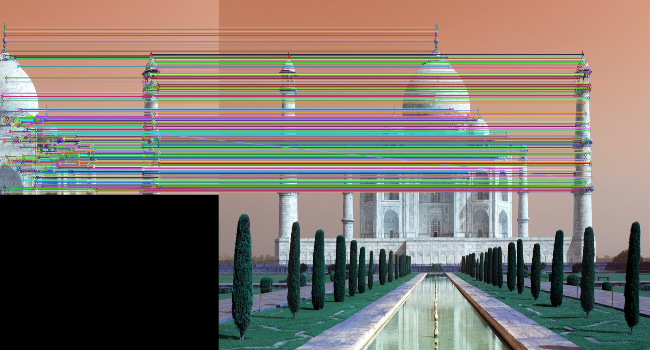

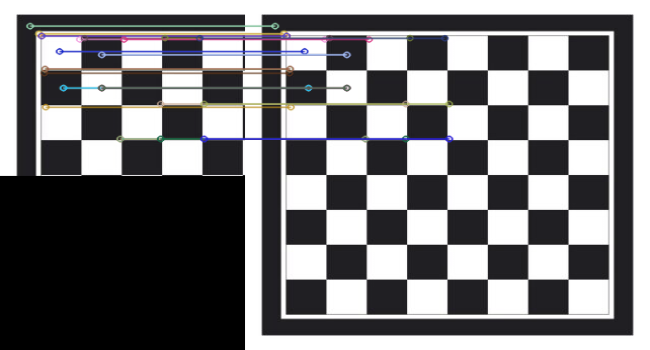

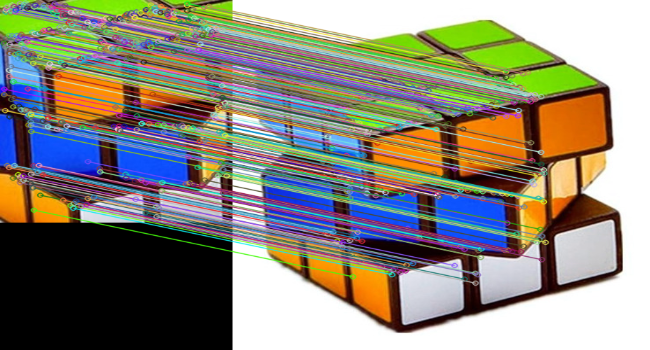

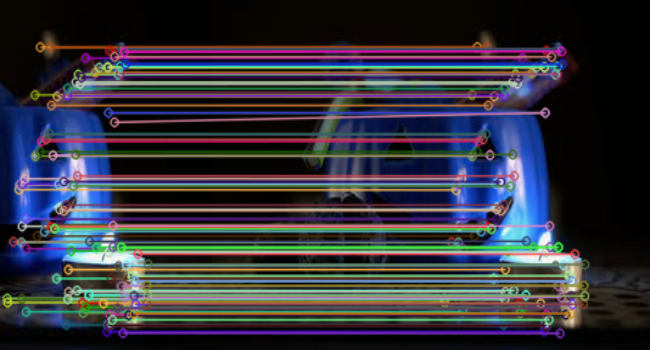

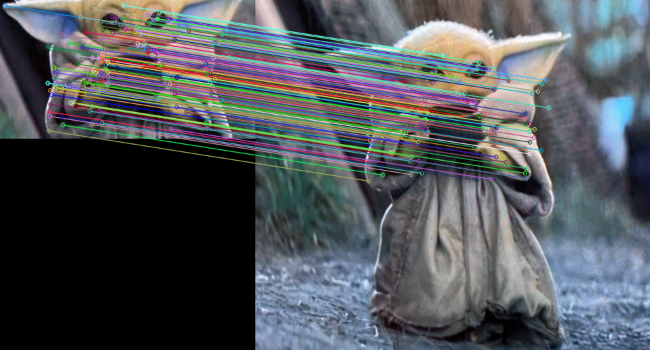

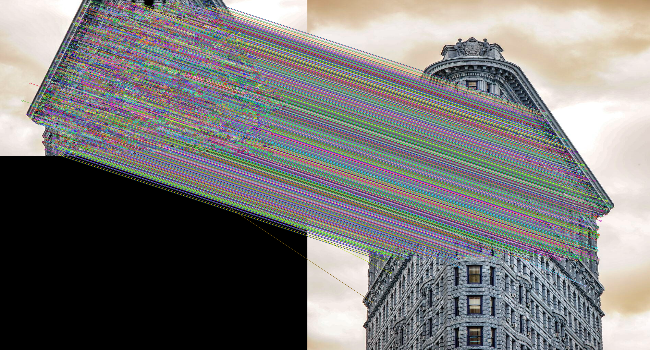

In [ ]:
cv2_imshow(img_bfsift)
cv2_imshow(img_bfsift2)
cv2_imshow(img_bfsift3)
cv2_imshow(img_bfsift4)
cv2_imshow(img_bfsift5)
cv2_imshow(img_bfsift6)

**FLANN Matcher**

In [ ]:
def flannAlg(query_img, train_img):
  query_img_bw = cv2.cvtColor(query_img,cv2.COLOR_BGR2GRAY)
  train_img_bw = cv2.cvtColor(train_img, cv2.COLOR_BGR2GRAY)
  sift = cv2.xfeatures2d.SIFT_create()
  keypoints1, descriptors1 = sift.detectAndCompute(query_img_bw, None)
  keypoints2, descriptors2 = sift.detectAndCompute(train_img_bw, None)

  FLAN_INDEX_KDTREE = 0
  index_params = dict(algorithm = FLAN_INDEX_KDTREE, trees=5)
  search_params = dict(checks=50)

  flann = cv2.FlannBasedMatcher(index_params, search_params)

  matches = flann.knnMatch(descriptors1, descriptors2,k=2)
  good_matches = []

  for m1, m2 in matches:
    if m1.distance < 0.5 * m2.distance:
      good_matches.append([m1])

  flann_matches = cv2.drawMatchesKnn(query_img, keypoints1, train_img, keypoints2, good_matches, None, flags=2)
  flann_matches = cv2.resize(flann_matches, (650,350))
  return flann_matches

In [ ]:
img_flann = flannAlg(query_img, img1)
img_flann2 = flannAlg(query_img2, img2)
img_flann3 = flannAlg(query_img3, img3)
img_flann4 = flannAlg(query_img4, img4)
img_flann5 = flannAlg(query_img5, img5)
img_flann6 = flannAlg(query_img6, img6)

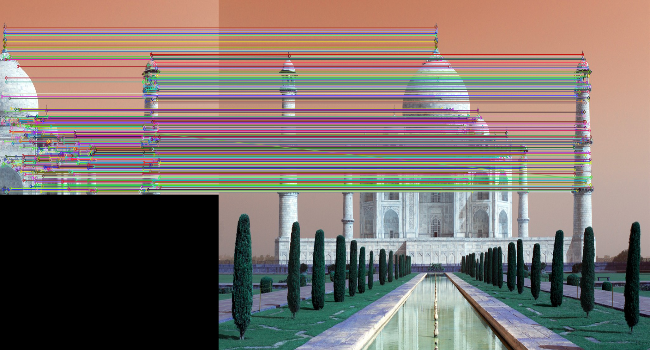

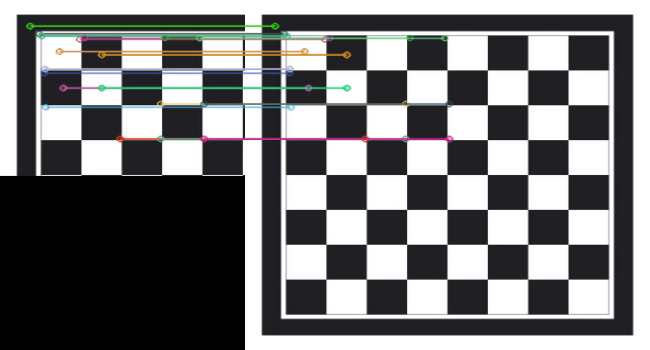

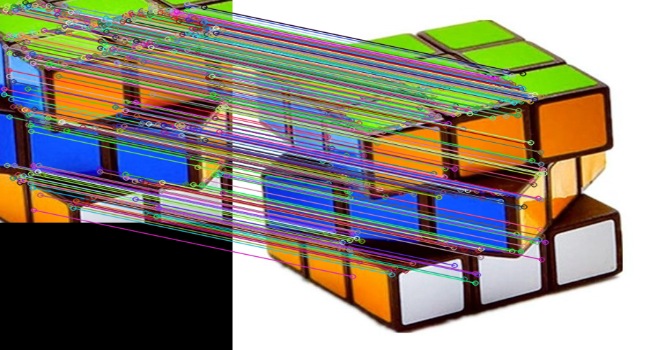

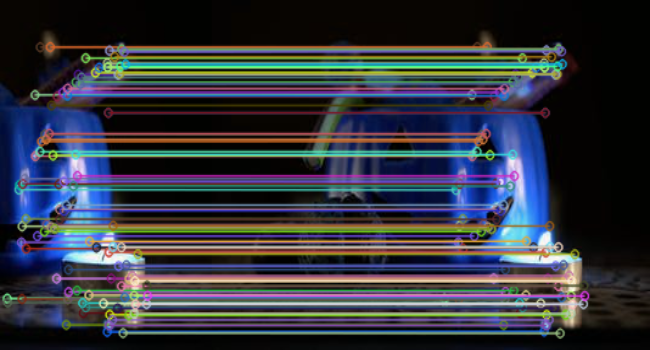

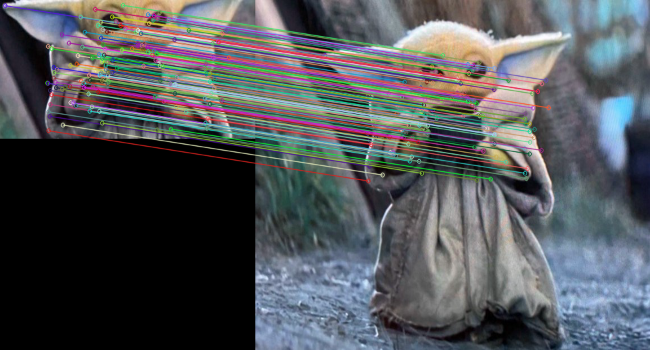

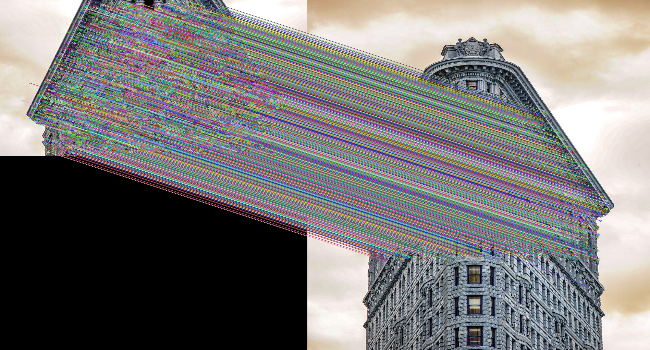

In [ ]:
cv2_imshow(img_flann)
cv2_imshow(img_flann2)
cv2_imshow(img_flann3)
cv2_imshow(img_flann4)
cv2_imshow(img_flann5)
cv2_imshow(img_flann6)

## Questão 4

Escolha e descreva uma metodologia completa para geração de correspondências. Experimente 3 quantidades distintas de correspondências retornadas, variando parâmetros dos algoritmos. Aplique esta metodologia em duas imagens, exiba e discuta a qualidade dos resultados (correspondências corretas vs. outliers). Estes resultados devem ser exibidos com segmentos de reta entre imagens representando suas correspondências.

In [ ]:
def briefKPDES(img):
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  fast = cv2.xfeatures2d.StarDetector_create()
  brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
  kp = fast.detect(gray, None) # Find the keypoints with FAST
  kp, des = brief.compute(gray, kp) # Compute the descriptors with BRIEF
  return kp, des

def BFMatcher(img1, img2, nMatches=50):
  kp1, des1 = briefKPDES(img1)
  kp2, des2 = briefKPDES(img2)
  bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
  matches = bf.match(des1, des2)
  matches = sorted(matches, key = lambda x:x.distance)
  result = cv2.drawMatches(img1, kp1, img2, kp2, matches[:nMatches], img2, flags=2)
  return result

def KNNMatcher(img1, img2, nMatches=50):
  kp1, des1 = briefKPDES(img1)
  kp2, des2 = briefKPDES(img2)
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(des1, des2, k=2)
  good_matches = []
  for m in matches:
    if m[0].distance/m[1].distance < 0.5:
      good_matches.append(m)
  good_matches_arr = np.asarray(good_matches)
  result = cv2.drawMatches(img1, kp1, img2, kp2, good_matches_arr[:nMatches], img2, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  return result

Text(0.5, 1.0, '35 correspondências')

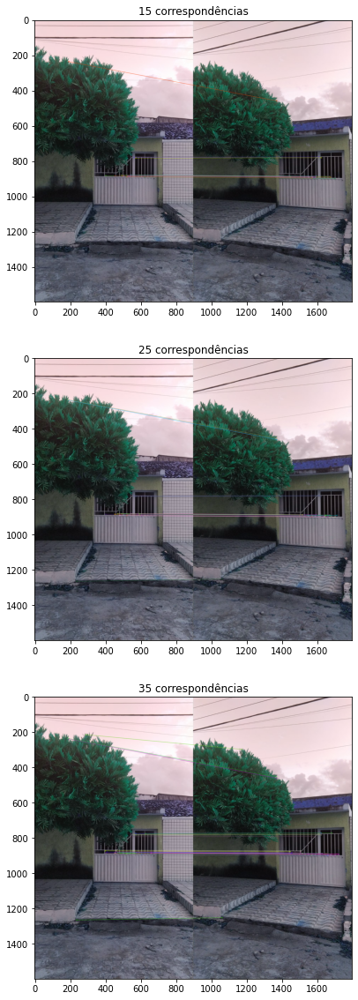

In [ ]:
img_match1 = io.imread('https://user-images.githubusercontent.com/52829664/166255836-8fb1ae68-4151-49a6-9d65-7c835c43d4ad.jpeg')
img_match2 = io.imread('https://user-images.githubusercontent.com/52829664/166255855-327c6047-4050-4164-a80c-50231511c16e.jpeg')
result1 = BFMatcher(img_match1,img_match2,15)
result2 = BFMatcher(img_match1,img_match2,25)
result3 = BFMatcher(img_match1,img_match2,35)

f, axs = plt.subplots(3,1,figsize=(20,20))
axs[0].imshow(cv2.cvtColor(result1,cv2.COLOR_BGR2RGB))
axs[0].set_title('15 correspondências')
axs[1].imshow(cv2.cvtColor(result2,cv2.COLOR_BGR2RGB))
axs[1].set_title('25 correspondências')
axs[2].imshow(cv2.cvtColor(result3,cv2.COLOR_BGR2RGB))
axs[2].set_title('35 correspondências')

Utilizamos algoritmo de BRIEF para caracterizar os keypoints, uma vez que é um algoritmo que consome menos memória. Utilizamos o detector STAR que é o recomendado pela documentação e pelo artigo original do BRIEF. Para realizar o matching, utilizamos o Brute Force Matcher por ser um método mais simples e intuitivo. Utilizamos o número máximo de match como 15, 25 e 35.
Podemos perceber que retornando 15 matches conseguimos uma grande quantidade de correspondências corretas, e um outlier. Quando aumentamos para 25 matches, a quantidade de outliers aumenta enquanto a quantidade de correspondências corretas se mantém. Ao aumentarmos para 35 matches, percebemos que a quantidade de correspondências corretas aumentam, mas também sofremos um aumento na quantidade de outliers.
Logo, um bom valor para utilizarmos neste caso seria entre 15 e 25 matches uma vez que a quantidade de correspondências corretas vai ser maior que o número de outliers. Valores maiores que 25 tenderá a nos retornar mais outliers.

## Questão 5

Explique em palavras o que significa unicidade de pontos de interesse e mostre exemplos visuais usando 1 imagem.

Quando temos uma imagem e queremos detectar uma feature com elementos que se repetem, o algoritmo deve ser capaz de descrever de forma unica essa feature. Assim, quando temos elementos de interesse similares, podemos utilizar conceito de taxa de distância para analisarmos o quão único é esse ponto de interesse com relação aos seus possíveis pares. Mesmo assim, há grande chance de existir outliers.
Como exemplo, podemos ver as imagens abaixo

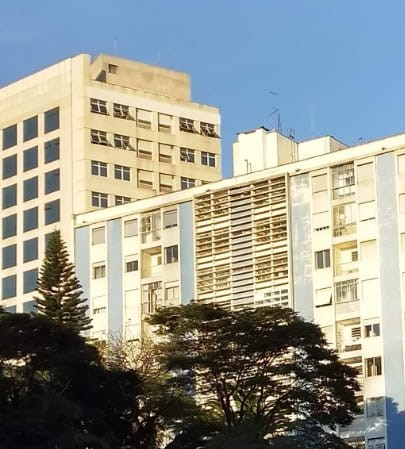
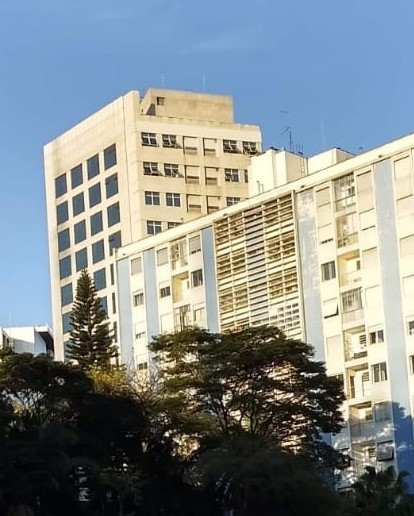

Percebemos que as janelas do prédio possuem características similares entre si. O algoritmo deve ser capaz de poder distinguir entre esses pontos de interesse de tal modo que não confunda o matching entre as imagens.

## Questão 6

Aplique o filtro LoG em pelo menos 6 escalas distintas (você pode
usar a OpenCV). Em seguida, implemente um algoritmo que determina se
um pixel (*x, y, s*) é um máximo local no espaço de posição-escala. Aplique este algoritmo em todos os pixels das imagens resultantes para encontrar estes extremos, e pinte estes pixels de uma cor diferente. Exiba as imagens resultantes. Obs.: você não precisa aplicar na imagem de menor e maior escala, nem nos pixels do bordo da imagem, visto que eles não tem uma vizinhança completa.

In [ ]:
def Zero_crossing(image):
    z_c_image = np.zeros(image.shape)
    
    # For each pixel, count the number of positive
    # and negative pixels in the neighborhood
    
    for i in range(1, image.shape[0] - 1):
        for j in range(1, image.shape[1] - 1):
            negative_count = 0
            positive_count = 0
            neighbour = [image[i+1, j-1],image[i+1, j],image[i+1, j+1],image[i, j-1],image[i, j+1],image[i-1, j-1],image[i-1, j],image[i-1, j+1]]
            d = max(neighbour)
            e = min(neighbour)
            for h in neighbour:
                if h>0:
                    positive_count += 1
                elif h<0:
                    negative_count += 1


            # If both negative and positive values exist in 
            # the pixel neighborhood, then that pixel is a 
            # potential zero crossing
            
            z_c = ((negative_count > 0) and (positive_count > 0))
            
            # Change the pixel value with the maximum neighborhood
            # difference with the pixel

            if z_c:
                if image[i,j]>0:
                    z_c_image[i, j] = image[i,j] + np.abs(e)
                elif image[i,j]<0:
                    z_c_image[i, j] = np.abs(image[i,j]) + d
                
    # Normalize and change datatype to 'uint8' (optional)
    z_c_norm = z_c_image/z_c_image.max()*255
    z_c_image = np.uint8(z_c_norm)

    return z_c_image

def LoG(image,scale):
  gaussian = cv2.GaussianBlur(image,(0,0),scale)
  laplacian = cv2.Laplacian(gaussian,cv2.CV_64F)
  laplacian1 = Zero_crossing(laplacian)
  return laplacian1

def LoG_2(image,scale):
  image_copy = image.copy()
  #image_copy = cv2.cvtColor(image_copy,cv2.COLOR_GRAY2BGR)
  gaussian = skimage.filters.gaussian(image_copy,sigma=scale)
  laplacian = skimage.filters.laplace(gaussian,ksize=7)
  abs_dst = cv2.normalize(laplacian,-1,0,255,cv2.NORM_MINMAX,cv2.CV_8UC1)
  retImage = cv2.cvtColor(abs_dst,cv2.cv2.COLOR_BGR2GRAY)
  return retImage

In [ ]:
# NÃO RODE ESTE BLOCO DE CÓDIGO, VOCÊ FOI AVISADO!!!!!
image1 = img6
image_copy = image1.copy()
#image_copy = cv2.cvtColor(image_copy,cv2.COLOR_GRAY2BGR)
mask = np.zeros(image1.shape)

scales = [5,9,13,17,21,25]
images = []
for scale in scales:
  result = LoG_2(image1,scale)
  images.append(result)
#print(image1.shape)

for imageindex in range(1,len(scales)-1):
  prevImage = images[imageindex-1]
  currentImage = images[imageindex]
  nextImage = images[imageindex+1]
  for y in range(1,image1.shape[0]-1):
    for x in range(1,image1.shape[1]-1):
      current = currentImage[y][x]
      options = [prevImage[y-1][x-1],
                 prevImage[y-1][x],
                 prevImage[y-1][x+1],
                 prevImage[y][x-1],
                 prevImage[y][x],
                 prevImage[y][x+1],
                 prevImage[y+1][x-1],
                 prevImage[y+1][x],
                 prevImage[y+1][x+1],
                 currentImage[y-1][x-1],
                 currentImage[y-1][x],
                 currentImage[y-1][x+1],
                 currentImage[y][x-1],
                 current,
                 currentImage[y][x+1],
                 currentImage[y+1][x-1],
                 currentImage[y+1][x],
                 currentImage[y+1][x+1],
                 nextImage[y-1][x-1],
                 nextImage[y-1][x],
                 nextImage[y-1][x+1],
                 nextImage[y][x-1],
                 nextImage[y][x],
                 nextImage[y][x+1],
                 nextImage[y+1][x-1],
                 nextImage[y+1][x],
                 nextImage[y+1][x+1]]
      
      maxValue = np.amax(options)
      #print(maxValue)
      #print(current)
      if maxValue == current:
        #mask[y][x] = 255
        cv2.circle(image_copy,(x,y),int(np.sqrt(2)*scales[imageindex]),(0,0,255))


      
#mask = cv2.dilate(mask,None)
# Threshold for an optimal value, it may vary depending on the image.
image_copy[mask>0]=[0,0,255]

Text(0.5, 1.0, 'Laplacian')

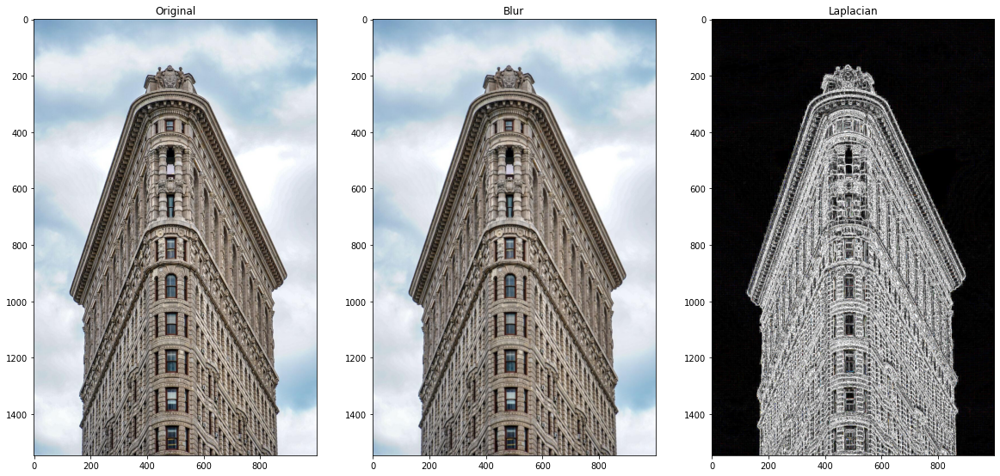

In [ ]:
image_original = img6
scale = 11.99
image_copy = image_original.copy()
#image_copy = cv2.cvtColor(image_copy,cv2.COLOR_GRAY2BGR)
kernel_size = 3
#gaussianKernel = cv2.getGaussianKernel(kernel_size,scale)
gaussian = cv2.GaussianBlur(image_copy,ksize=(kernel_size,kernel_size),sigmaX=0, sigmaY=0,borderType = cv2.BORDER_REFLECT)
#gaussian = cv2.sepFilter2D(image_copy,-1,gaussianKernel,gaussianKernel,borderType = cv2.BORDER_REFLECT)
src_gray = cv2.cvtColor(gaussian, cv2.COLOR_BGR2GRAY)
#print(np.ceil(6*scale))
laplacian = cv2.Laplacian(image_copy,cv2.CV_16S,ksize=kernel_size)
abs_dst = cv2.convertScaleAbs(laplacian)
#laplacian1 = Zero_crossing(laplacian)
#print(laplacian)

f, axs = plt.subplots(1,3,figsize=(20,20))
axs[0].imshow(image_original)
axs[0].set_title('Original')
axs[1].imshow(gaussian)
axs[1].set_title('Blur')
axs[2].imshow(abs_dst)
axs[2].set_title('Laplacian')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
  """


Text(0.5, 1.0, 'Laplacian')

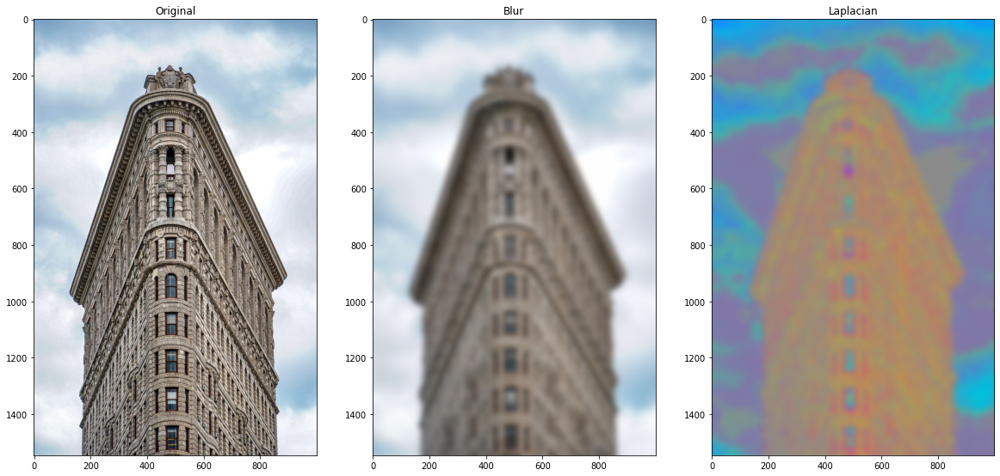

In [ ]:
image_original = img6
scale = 11
image_copy = image_original.copy()
#image_copy = cv2.cvtColor(image_copy,cv2.COLOR_GRAY2BGR)
gaussian = skimage.filters.gaussian(image_copy,sigma=scale)
#gaussian = gaussian.astype(np.float)
laplacian = skimage.filters.laplace(gaussian,ksize=7)
abs_dst = cv2.normalize(laplacian,-1,0,255,cv2.NORM_MINMAX,cv2.CV_8UC1)

f, axs = plt.subplots(1,3,figsize=(20,20))
axs[0].imshow(image_original)
axs[0].set_title('Original')
axs[1].imshow(gaussian)
axs[1].set_title('Blur')
axs[2].imshow(abs_dst)
axs[2].set_title('Laplacian')

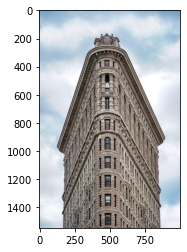

In [ ]:
plt.imshow(image_copy)


**Referências**

[Harris Corner Detection](https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html)

[Shi-Tomasi Corner Detector & Good Features to Track](https://docs.opencv.org/3.4/d4/d8c/tutorial_py_shi_tomasi.html)

[FAST Algorithm for Corner Detection](https://docs.opencv.org/3.4/df/d0c/tutorial_py_fast.html)

[Feature matching using ORB algorithm in Python-OpenCV](https://www.geeksforgeeks.org/feature-matching-using-orb-algorithm-in-python-opencv/)

[Feature Matching methods comparison in OpenCV](https://datahacker.rs/feature-matching-methods-comparison-in-opencv/)